In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
%matplotlib inline
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
import os

# Dog-breed-classification 🐕‍🦺🐕

Here we're gonna build model that's gonna classify dog breads and in turn predict the breed upon giving a dog picture.

**TensorFlow 2.0** and **TensorFlow Hub**

## 1. Problem
Identifying the dog breed given an image of dog.

## 2. Data
The data used is kaggle's dog breed identification competition.
[Here](https://www.kaggle.com/competitions/dog-breed-identification)

## 3. Evaluation
Evaluation is a file with predicted probabilities for each dog breed of test image
[Here](https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation)

## 4. Features
Some info about data:  

<li> We're dealing with images (unstructured data), so it's probably best we use Deep Learning/Transfer Learning
<li> 120 dog breeds (120 classes)
<li> 10k+ images in train set (these imagses have labels)
<li> 10k+ images in test set (these imagses do not have labels, we've to predict 
     them)


In [5]:
# Unzipping the dataset
# !unzip "drive/MyDrive/Colab Notebooks/Dog-breed-identification/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Dog-breed-identification"

In [6]:
# Mount the drive so that you can access the dataset
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Getting Workspace ready

> import tensorflow </br>
> import tensorflow hub </br>
> Make sure there's GPU </br>



In [7]:
import tensorflow as tf
import tensorflow_hub as hub
tf.__version__
hub.__version__
tf.config.list_physical_devices("GPU")

[]

## 1. Getting data ready

ML models understand only numerical data. </br>
We convert data to into **tensors** (which run on GPU)

### Setup filenames and boolean arrays

In [8]:
# Let's access the labels
path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/train/"
labels_csv = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/labels.csv')
labels_csv.describe(), labels_csv.head(3)

(                                      id               breed
 count                              10222               10222
 unique                             10222                 120
 top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
 freq                                   1                 126,
                                  id        breed
 0  000bec180eb18c7604dcecc8fe0dba07  boston_bull
 1  001513dfcb2ffafc82cccf4d8bbaba97        dingo
 2  001cdf01b096e06d78e9e5112d419397     pekinese)

In [9]:
# labels_csv["breed"].value_counts().plot.barh(figsize = (10, 25))
labels_csv["breed"].value_counts().median() #Number of images of each breed 85*120 = 10200
 

82.0

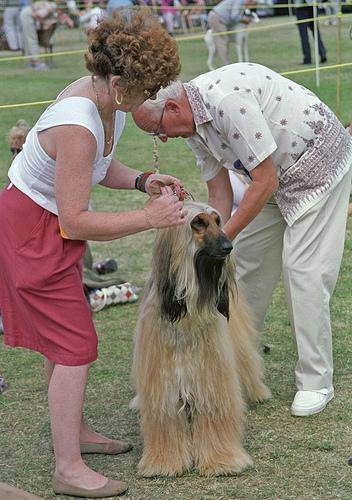

In [10]:
# let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/train/0a4f1e17d720cdff35814651402b7cf4.jpg")

In [11]:
# Images and their labels
filenames = [path + fnames + ".jpg" for fnames in labels_csv["id"]] 
len(filenames), len(labels_csv)
labels_csv["breed"][9000]

'tibetan_mastiff'

In [12]:
# let's prepare our labels
labels = labels_csv["breed"].to_numpy()
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [13]:
# Turn every label into array of booleans
labels[0] == unique_breeds
boolean_labels = [ unique_breeds == label for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [14]:
# Turning booleans to integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array 

print(boolean_labels[0].astype(int)) # there'll be a 1, where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating Validation Test

In [15]:
X = filenames
y = boolean_labels

We'll start with ~1000 imgs and increase as needed.

In [16]:
#set number of imgs for experimenting
NUM_IMAGES = 1000  #@param { type:"slider", min:100, max: 10000, step:1000}

In [17]:
from sklearn.model_selection import train_test_split
X = filenames
y = boolean_labels

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  train_size = 0.8,
                                                  random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

### Preprocessing Images (turning into Tensors)

To preprocess images into Tensors, we'd write a function which will do a few things:
<li> 1. Take an image filepath as input
<li> 2. Use TensorFlow to read the file and save it to a variable
<li> 3. Turn the `image` into tensors
<li> 4. NORMALIZE = Convert colour channel values from (0-255) values to (0-1)
<li> 5. Resize the `shape` of image to (224, 224)
<li> 6. Return the modified image


In [18]:
#Convert an image to numpy array
# import imread - from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [19]:
#turn image into `Tensors`
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [20]:
# Tensoflor package to read files/imgs/mp3
tf.io.read_file(filenames[20])

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [21]:
# create a func to preprocess image
IMG_SIZE = 224

def process_image(filepath, img_size = IMG_SIZE):
  """
  Takes an image filepath and turns it into Tensors
  """
  # Read the image
  image = tf.io.read_file(filepath)
   
  # Convert the jpeg img to numerical tensor with 3 colour channels (R, G, B)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from (0 - 255) to (0 - 1)
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired values (224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


### Turning our data into Batches

Why batches?

> All the data that you're training your model on doesn't fit into memory at once </br>
> So recommended batch size = 32 </br>
> It can be manually adjusted </br>
> In order to use `tf` effectively, we need data in the form of `Tensor tuple` which look like this: `(image, label)`

In [22]:
# Returns tuple (image, label)
def get_image_label(image_path, label):
  """
    Takes an image file path and it's label,
    processes the image and returns the tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label
  

In [23]:
# Demo
get_image_label(filenames[42], boolean_labels[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [24]:
# Function to turn all data into tuples of (img, label)
# define batch size 
BATCH_SIZE = 32

# Turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, validation_data = False, test_data = False):
  """
    Creates batches of data out of img `X` and label `y` pairs .
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels)
  """

  # if test data, no labels
  if test_data:
    print('Creating test data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file path, no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif validation_data:
    print('Creating validation data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # file paths 
                                               tf.constant(y))) # labels
    # Create (img, label) tuples and also turns img to preprocessed image
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  
  else:
    print('Creating training data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # file paths 
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels
    data = data.shuffle(buffer_size = len(X))

    # Create (img, label) tuples and also turns img to preprocessed image
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [25]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, validation_data = True)
train_data.element_spec, val_data.element_spec, 

Creating training data batches....
Creating validation data batches....


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing data batches

In [26]:
# Creating func to view img in a data batch
def show_25_images(images, labels):
  """
  Displays imgs and labels from a batch
  """
  plt.figure(figsize = (15, 15))
  for i in range(25):
    # Create subplots 5 X 5
    ax = plt.subplot(5, 5, i+1)
    # show img
    plt.imshow(images[i])
    # Add the label as title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

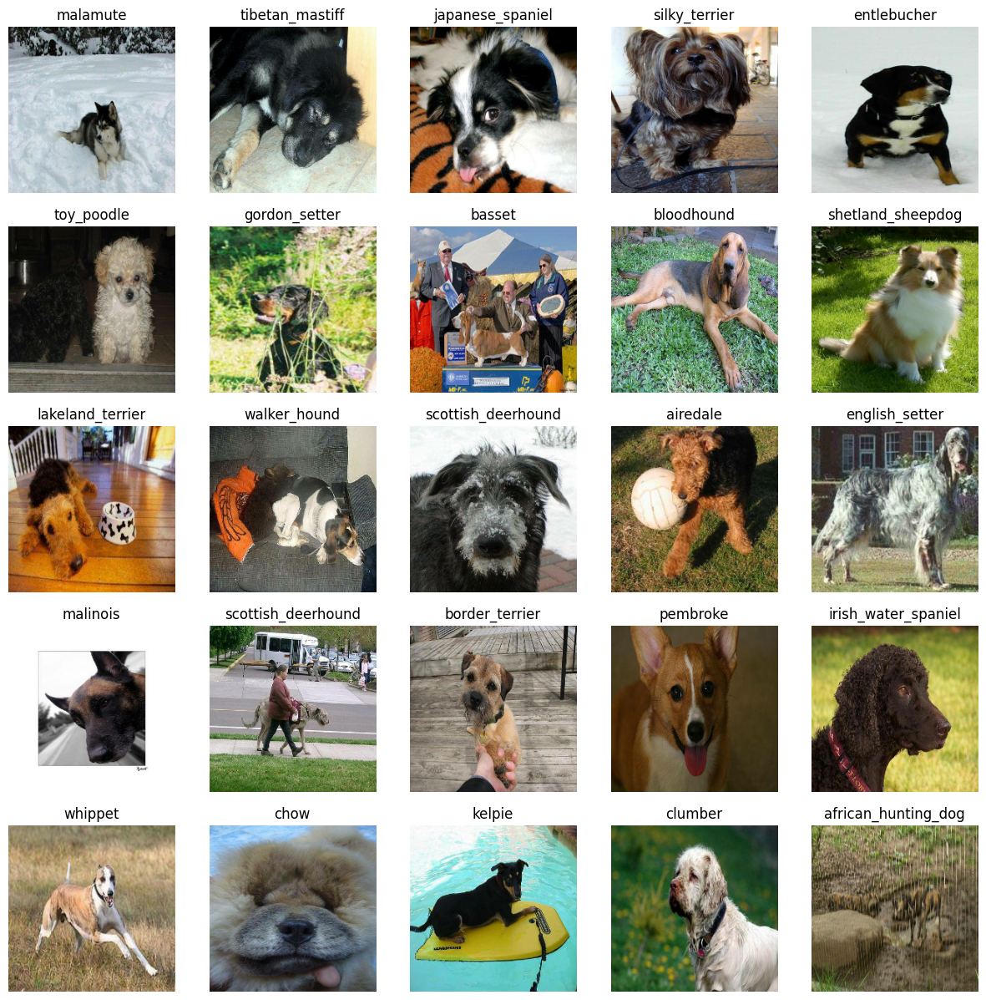

In [27]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

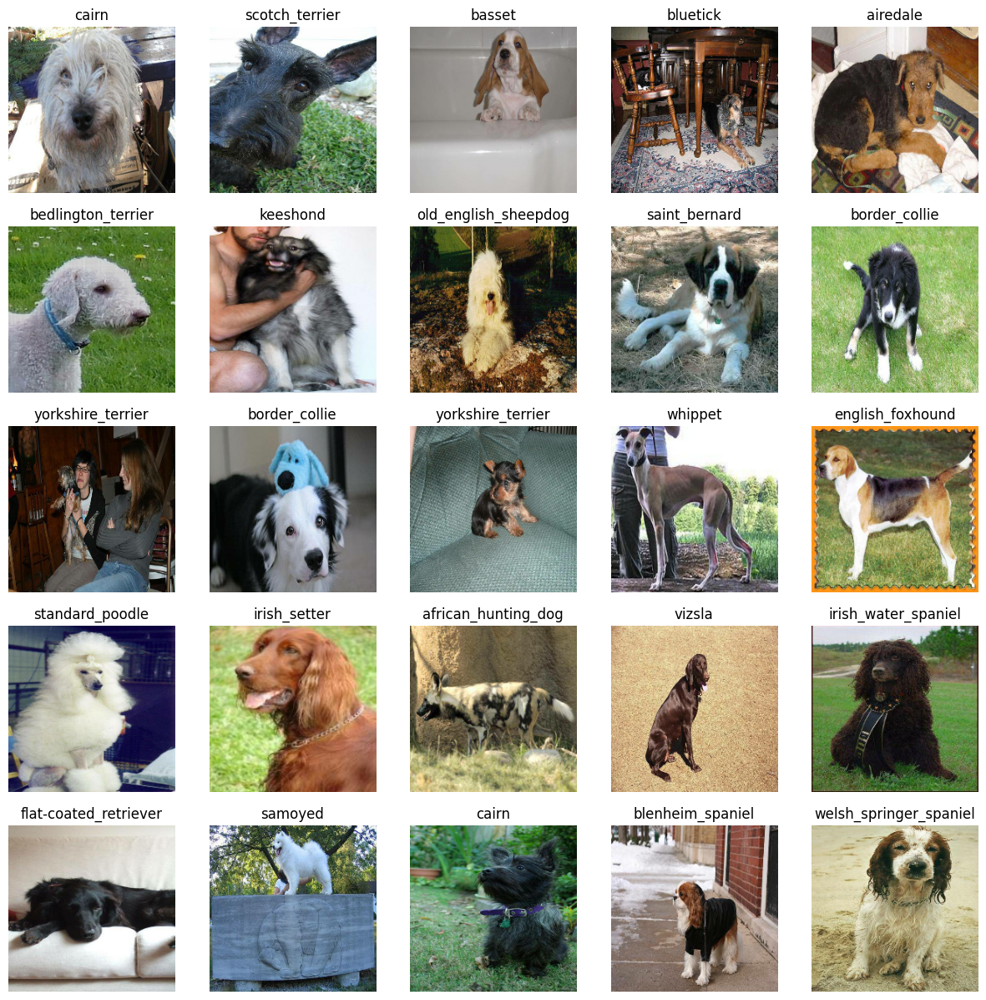

In [28]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## 2. Building a Model

Before we build a model, we need to **define**: 
> the `input` shape (our image shape, in the form of `Tensors`) to our model <br/>
> the `output` shape (image labels, in the form of `Tensors`) to our model. </br>
> The `URL` of the model we want to use [this](https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5) </br>

In [29]:
# input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE,  3]

# output shape
OUTPUT_SHAPE = len(unique_breeds)

#Model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"
 

Let's put the above things into A `KERAS` DL model.

Let's create a function:
> Inputs -> input shape, output shape, model </br>
> Define the layers in a Keras model in sequential fashion (one after the another) </br>
> Compiles the model (says how it should be evaluated and improved) </br>
> Builds the model (tell's the model the input shape it'll be getting) </br>
> Returns the model

All these steps can be found here: [here](https://www.tensorflow.org/guide/keras/overview)

In [30]:
# Create a function that builds a Keras model

def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with: {}", MODEL_URL)

  #Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer - 1, Input layer
      tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax"), # Layer - 2, Output layer

  ])

  #Compile model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(), 
      metrics = ["accuracy"]
  )

  # build the model
  model.build(INPUT_SHAPE)
  
  # Return the model
  return model


In [31]:
model = create_model()
model.summary()

Building model with: {} https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### Creating callbacks

Helper functions a model can use during training to do such things as save it's progress, check it's progress, stop training early if improvement stops. </br>

We'll create two callbacks
> 1. For `tensorboard`, which helps track our model's progress
> 2. For `early stopping` which prevents our model from training for too long

#### Tensorboard callback

3 things to do 
1. Load the tensorboard notebook extension
2. Create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function
3. Visualize our model's training logs with `%tensorboard magic()` function

In [32]:
# Load tb extension
%load_ext tensorboard
import datetime

def create_tensorboard_callback():
  # Create a log dir
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
  return tf.keras.callbacks.TensorBoard(logdir) 





#### Early Stopping callback

Helps stop our model from overfitting by stopping training if monitored evaluation metric stops improving. </br>
Check it [here](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)



In [33]:
#Create a early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

### Training the model (on subset of data)

In [34]:
# Number of passes our model has to do on data
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}

In [35]:
print("GPU AVAILABLE" if tf.config.list_physical_devices("GPU") else "YOU CAN'T TRAIN")

YOU CAN'T TRAIN


**Create a function to train the model**
1. Create a model `create_model()`
2. Setup a Tensorboard callback using `create_tensorboard_callback()`
3. Call `fit()` on model passing it train_data, validation_data, number_of_epochs, and the callbacks.
4. Return the model 

In [36]:
# Function to train the model and return the trained version
def train_model():

  model = create_model()

  tensorboard = create_tensorboard_callback()

  model.fit(x = train_data, 
            epochs = NUM_EPOCHS, 
            validation_data = val_data, 
            validation_freq = 1, 
            callbacks = [tensorboard, early_stopping])
  
  return model


In [37]:
# fit the model to data
model = train_model() 

Building model with: {} https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 163s 6s/step - loss: 4.4934 - accuracy: 0.1125 - val_loss: 3.5167 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 74s 3s/step - loss: 1.6205 - accuracy: 0.7063 - val_loss: 2.2166 - val_accuracy: 0.5450
Epoch 3/100
25/25 [==============================] - 73s 3s/step - loss: 0.5681 - accuracy: 0.9375 - val_loss: 1.7371 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 81s 3s/step - loss: 0.2464 - accuracy: 0.9912 - val_loss: 1.4928 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 72s 3s/step - loss: 0.1459 - accuracy: 0.9950 - val_loss: 1.4083 - val_accuracy: 0.6700
Epoch 6/100
25/25 [==============================] - 94s 4s/step - loss: 0.0994 - accuracy: 1.0000 - val_loss: 1.3617 - val_accuracy: 0.6750
Epoch 7/100
25/25 [==============================] - 73s 

**Question:** What are some ways to prevent Overfitting ?
Because model is performing better on train set and poor on val_set

### Checking tensorboard logs

tensorboard magic function (`%tensorboard`) will access logs and visualize it

In [38]:
%tensorboard --logdir /content/drive/MyDrive/Colab\ Notebooks/Dog-breed-identification/logs

<IPython.core.display.Javascript object>

## 3. Making and Evaluating Predictions using Trained model 

In [42]:
predictions = model.predict(val_data, verbose = 1)
predictions, predictions.shape, np.sum(predictions[0])

(array([[2.98621919e-04, 7.74112141e-06, 2.12846044e-03, ...,
         2.19109119e-04, 1.13762864e-04, 3.83884134e-03],
        [6.77158474e-04, 6.27976027e-04, 1.74241106e-03, ...,
         1.06705484e-04, 6.78792037e-03, 2.50195844e-05],
        [1.93232654e-06, 3.36441299e-05, 6.20397986e-05, ...,
         2.27830442e-05, 5.44286668e-05, 1.07148051e-04],
        ...,
        [5.59193904e-06, 1.01902979e-05, 7.98214533e-05, ...,
         4.78816855e-06, 6.92010362e-05, 5.86121814e-06],
        [1.53050129e-03, 1.72745218e-04, 7.49073661e-05, ...,
         1.61600823e-04, 1.69084506e-05, 3.56784323e-03],
        [2.30650679e-04, 8.17313594e-06, 1.04249141e-03, ...,
         4.89338709e-04, 1.34834647e-03, 1.26018931e-04]], dtype=float32),
 (200, 120),
 1.0)

In [ ]:
ind = 120
print(predictions[ind])
print(f"Max prediction prob (confidence level) : {np.max(predictions[ind])}")
print(f"Max prediction prob index : {np.argmax(predictions[ind])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[ind])]}")

**Prediction probabilities are also known as Confidence levels.**

In [54]:
#Prediction probs to label
def get_pred_label(pred_probs):
  max_prob_ind = np.argmax(pred_probs)
  return unique_breeds[max_prob_ind]

pred_label = get_pred_label(predictions[81])
pred_label

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
val_data

Since validation dataset is in batch dataset, we should unbatch it to make predictions on validation images and then compare them to val_labels 

In [63]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  data -> Tensors of batched(imgs, labels)
  Returns separate arrays of imgs and labels
  """
  images_ = []
  labels_ = []
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]  


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got to get:
1. Prediction labels
2. Validation labels
3. Validation images

Create a function that: 
1. Takes an arr of pred_probs, arr of truth labels, an arr of imgs and an int.
2. Convert pred probs to pred label
3. Plot the pred label, it's pred prob, truth label, and target img in a single plot 


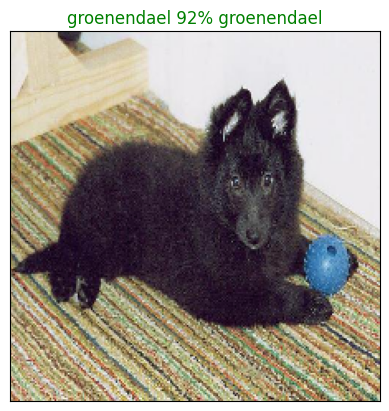

In [72]:
def plot_pred(pred_probs, labels, images, n=1):
  """
  View pred, truth, img for sample = n
  """
  pred_prob, true_label, img = pred_probs[n ], labels[n], images[n]

  #Get pred label
  pred_label = get_pred_label(pred_prob)

  #Plot image and remove ticks
  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])
  
  #Change colour
  if pred_label == true_label:
    colour = "green"
  else:
    colour = "red"

  #Plot title -> predicted, prob of pred, and true label
  plt.title("{} {:2.0f}% {}".format(pred_label, np.max(pred_prob)*100, true_label),color = colour)

plot_pred(pred_probs = predictions, labels = val_labels, images = val_images, n = 77)


**Function to view our models top 10 predictions**

This function will:
1. Input -> pred_probs arr and ground truth arr and an int
2. Find the pred label using `get_pred_label()`
3. Find the top 10
  1. Pred_prob indexes
  2. Pred_prob values
  3. Pred labels
4. Plot the top 10 pred_prb_vals, and labels  

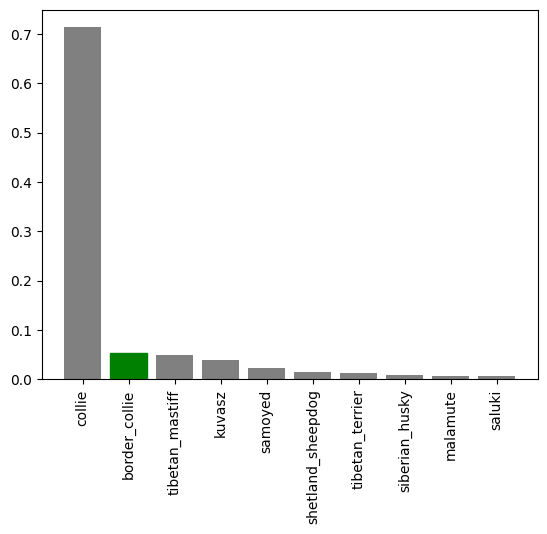

In [78]:
def plot_pred_conf(pred_probs, labels, n=1):
  """
  Top 10 prediction probs along with truth label for sample = n 
  """
  pred_prob, true_label = pred_probs[n], labels[n]

  #Get pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 pred confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 pred confidence vals
  top_10_pred_vals = pred_prob[top_10_pred_indices]

  # Find the top 10 pred labels 
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_vals, color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)), labels = top_10_pred_labels, rotation="vertical")

  #Change colour of top 10
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

plot_pred_conf(pred_probs = predictions, labels = val_labels, n = 9)

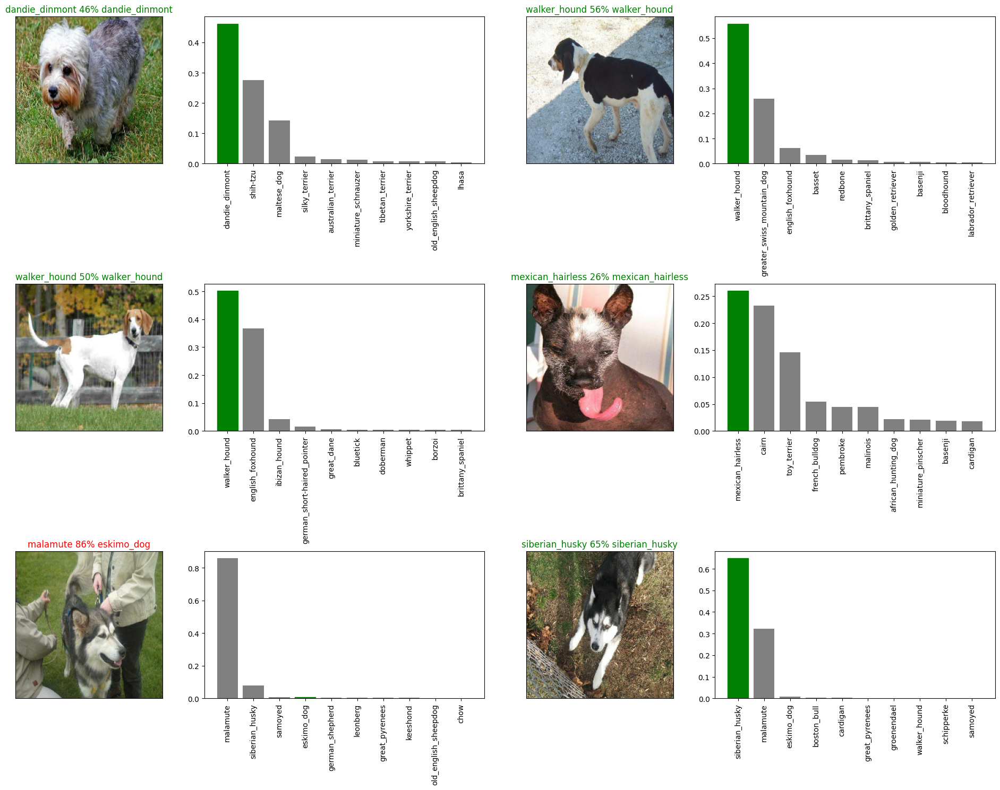

In [84]:
# Predictions and values
i_multiplier = 30
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i + 1)
  plot_pred(pred_probs = predictions, 
           labels = val_labels,
           images = val_images,
           n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i + 2)
  plot_pred_conf(pred_probs = predictions, 
           labels = val_labels,
           n = i+i_multiplier)
  plt.tight_layout()
plt.show()

## 4. SAVE and LOAD model

In [88]:
# Create a function to save a model
def save_model(model, suffix = None):

  # Create a model dir 
  model_dir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/trained_models", 
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [91]:
# Load a model 
def load_model(model_path):
  print(f"Loading model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects= {"KerasLayer": hub.KerasLayer})
  return model

In [89]:
save_model(model, suffix="1000-images-mobilenet-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/trained_models/20230520-07341684568062-1000-images-mobilenet-Adam.h5


'/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/trained_models/20230520-07341684568062-1000-images-mobilenet-Adam.h5'

In [93]:
loaded_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/trained_models/20230520-07341684568062-1000-images-mobilenet-Adam.h5")
loaded_model.summary()

Loading model from: /content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/trained_models/20230520-07341684568062-1000-images-mobilenet-Adam.h5
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [96]:
loaded_model.evaluate(val_data), model.evaluate(val_data)

7/7 [==============================] - 13s 2s/step - loss: 1.2064 - accuracy: 0.7000


([1.2064435482025146, 0.699999988079071],
 [1.2064435482025146, 0.699999988079071])

## Training on full data

In [98]:
# Create data batches with full data
full_data = create_data_batches(X, y)
len(X), len(y), full_data

Creating training data batches....


(10222,
 10222,
 <_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>)

In [99]:
# create a model (training  all data)
full_model = create_model()

Building model with: {} https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [100]:
# create callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience= 3)


**Following cell will take more than 40 mins (1st epoch) with GPU, because the GPU we're running should have to load all the images into memory. </br>
</br>
If no GPU, don't even run it.**

In [ ]:
# Fit full train data to model
full_model.fit(x = full_data, 
               epochs = NUM_EPOCHS
               callbacks = [full_model_tensorboard, full_model_early_stopping]) 

In [ ]:
# Save the full model
full_model_path = save_model(full_model, suffix="full_model_imagenet_Adam")

In [ ]:
# Load the full model
loaded_full_model = load_model(full_model_path)

## Predictions on test-data

Data set has to be in the same format (batches). 
We have `create_data_batches()` </br>

We set the `test_data = True` for test data (because here are no labels) </br>

Make predictions using `predict()` method.

In [3]:
# Get the filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste2844bf76c0ddeae02277d76c31e41f5.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste35b67fc659c84c31bccfbaf1dd0fe5f.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste7340d1efa70bf6d6c134e1e150f9473.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/testdeec42d608968cccb3ab91e306194fed.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste0c11786a50ce49abdb71397d711ecc9.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste0eea374c5170e90dc0b1ee795470ca6.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/teste774fbfeb4b712ca042f93edea3835af.jpg',
 '/content/drive/My

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames, test_data = True)

In [ ]:
# Make predictions (long time ~1hr)
test_predictions = loaded_full_model.predict(test_data, verbose = 1)

In [ ]:
#Save predictions to .csv file
np.savetext("/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/preds_arr.csv", test_predictions, delimiter = ",")

## Predictions on custom images


1. Get paths
2. Create batches with param `test_data = true`
3. Call predict
4. Convert probabilities to labels

In [ ]:
# Get paths
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dog-breed-identification/dog-pics"
custom_img_paths = [custom_path + fname for fname in os.listdir(custom_path)] 

In [ ]:
# Create batches
custom_data =create_data_batches(custom_img_paths, test_data = True)

In [ ]:
# Get predictions
custom_preds = loaded_full_model.predict(custom_data, verbose = 1)

In [ ]:
# Get labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
# Unbatch images
custom_images = []
for img in custom_data.unbatch().as_numpy_iterator():
  custom_images.add(img)

In [4]:
# Plot
plt.figure(figsize = (10, 10))
for i, image in custom_images:
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)



NameError: ignored

<Figure size 1000x1000 with 0 Axes>